In [1]:
import numpy as np
import jax.numpy as jnp
from jax import grad
import matplotlib.pyplot as plt
import matplotlib.animation as animation

In [2]:
plt.rcParams["animation.html"] = "jshtml"

In [3]:
class NormalDistribution:
    @staticmethod
    def pdf(x, mu, sigma):
        return jnp.exp(-0.5 * ((x-mu)/sigma)**2) / (sigma * jnp.sqrt(2*jnp.pi))
    
    @staticmethod
    def logpdf(x, mu, sigma):
        return jnp.log(NormalDistribution.pdf(x, mu, sigma))
    
    @staticmethod
    def sample(mu, sigma, n=1):
        xs = np.linspace(mu - 10*sigma, mu+10*sigma, 1024)
        cumpdf = np.cumsum([NormalDistribution.pdf(x, mu, sigma) for x in xs])
        cumpdf *= 1/cumpdf[-1]
        randv = np.random.uniform(size=n)
        idx1 = np.searchsorted(cumpdf, randv)
        idx0 = np.where(idx1==0, 0, idx1-1)
        idx1[idx0==0] = 1
        frac1 = (randv - cumpdf[idx0]) / (cumpdf[idx1] - cumpdf[idx0])
        return xs[idx0]*(1-frac1) + xs[idx1]*frac1
    
    @staticmethod
    def plot(mu, sigma, width=10, n=1000, x=None, ax=None):
        ax = ax or plt.gca()
        x = x if x is not None else np.linspace(mu - width*sigma, mu + width*sigma, n)
        return ax.plot(x, NormalDistribution.pdf(x, mu, sigma))

In [4]:
class NormalDistributionBlackboxOptimizer:
    def __init__(self, f, lr, mu=0.0, sigma=1.0, n=100):
        self.f = f
        self.lr = lr
        self.mu = mu
        self.sigma = sigma
        self.n = n
    
    def step(self):
        samples = NormalDistribution.sample(self.mu, self.sigma, n=self.n)
        dj_dmu = np.array([self.f(x) * grad(NormalDistribution.logpdf, 1)(x, self.mu, self.sigma) for x in samples]).mean()
        dj_dsigma = np.array([self.f(x) * grad(NormalDistribution.logpdf, 2)(x, self.mu, self.sigma) for x in samples]).mean()
        self.mu = self.mu + self.lr * dj_dmu
        self.sigma = max(0.5, self.sigma + self.lr * dj_dsigma)

In [5]:
def make_animation_for_function(f, steps=200, lr=0.1):
    optimizer = NormalDistributionBlackboxOptimizer(f, lr=lr)
    frames = []
    fig, ax = plt.subplots()
    xlim = (0, 0)
    for _ in range(steps):
        optimizer.step()
        xs = np.linspace(min(xlim[0], optimizer.mu - 10*optimizer.sigma), max(xlim[1], optimizer.mu + 10*optimizer.sigma), 1000)
        l1, = NormalDistribution.plot(optimizer.mu, optimizer.sigma, x=xs, ax=ax)
        l2, = ax.plot(xs, [f(x) for x in xs])
        frames.append((l1, l2, optimizer.mu, optimizer.sigma))
    plt.close()
    
    fig, ax = plt.subplots()
    line_d, = ax.plot([], [])
    line_f, = ax.plot([], [])

    def animate(frames):
        frame_d, frame_f, mu, sigma = frames
        d_x, d_y = frame_d.get_xdata().tolist(), frame_d.get_ydata().tolist()
        f_x, f_y = frame_f.get_xdata().tolist(), frame_f.get_ydata().tolist()
        ax.set_xlim(min(d_x + f_x), max(d_x + f_x))
        ax.set_ylim(min(d_y + f_y + [ax.get_ylim()[0]]), max(d_y + f_y + [ax.get_ylim()[1]]))
        line_d.set_data(d_x, d_y)
        line_d.set_label(f"μ = {mu:.3f}, σ = {sigma:.3f}")
        line_f.set_data(f_x, f_y)
        ax.legend()
        return line_d, line_f

    return animation.FuncAnimation(fig, animate, frames=frames, blit=True)

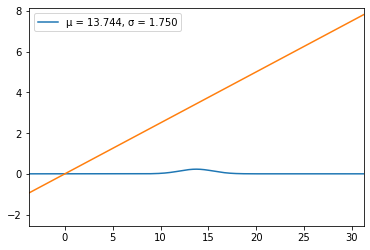

In [6]:
make_animation_for_function(lambda x: 0.25 * x, lr=0.25, steps=250)

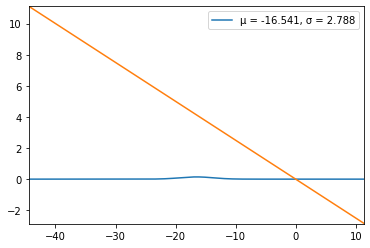

In [7]:
make_animation_for_function(lambda x: -0.25 * x, lr=0.25, steps=250)

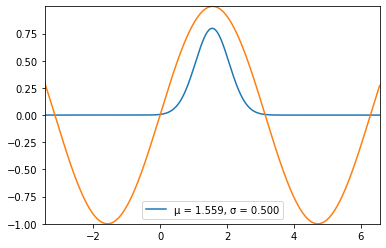

In [8]:
make_animation_for_function(lambda x: np.sin(x), lr=0.05, steps=250)

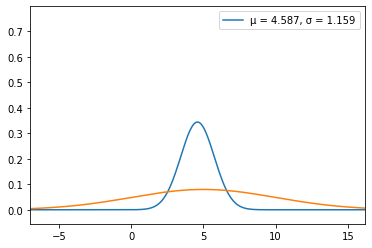

In [9]:
make_animation_for_function(lambda x: NormalDistribution.pdf(x, 5.0, 5.0), lr=10, steps=250)